In [24]:
import scanpy as sc

In [25]:
adata_ss2 = sc.read('../../SS2/data/adata_assigned.h5ad')

In [26]:
sc.set_figure_params(dpi_save=600)
import scFates as scf

In [27]:
import scvelo as scv
scf.set_figure_pubready()

In [28]:
adata=sc.read("adatas/T19_adata.h5ad")
adata_velo=sc.read("adatas/T19_adata_velo.h5ad")

In [29]:
color_dict=dict(zip(['fibroblast', 'schwann_cell', 'tumor'],["#11a624","orange","red"]))

In [30]:
adata.uns["annotations_colors"]=[color_dict[a] for a in adata.obs.annotations.cat.categories]

In [31]:
from scipy.stats import pearsonr

In [32]:
from glob import glob

In [33]:
patients=[p.split("/")[1].split("_")[0] for p in glob("adatas/*adata.*")]

In [34]:
adata_ss2.uns["assignments_colors"]

array(['#cc2c30', '#3577b3', '#f58023', '#3f9d68', '#ffb0af', '#a644fb',
       '#88564c', '#dc79c2', '#ffd700', '#b5bd63', '#47bece', '#b1c7e7',
       '#d3d3d3'], dtype=object)

In [35]:
import pandas as pd
ass_cols=pd.Series(adata_ss2.uns["assignments_colors"],index=adata_ss2.obs.assignments.cat.categories)

adata_ss2.obs.assignments=adata_ss2.obs.assignments.astype(str)
adata_ss2.obs.loc[adata_ss2.obs.Hub_leiden=="True","assignments"]="Hub"
adata_ss2.obs.assignments=adata_ss2.obs.assignments.astype("category")

ass_cols["Hub"]="lightgrey"

ass_cols["none"]="grey"



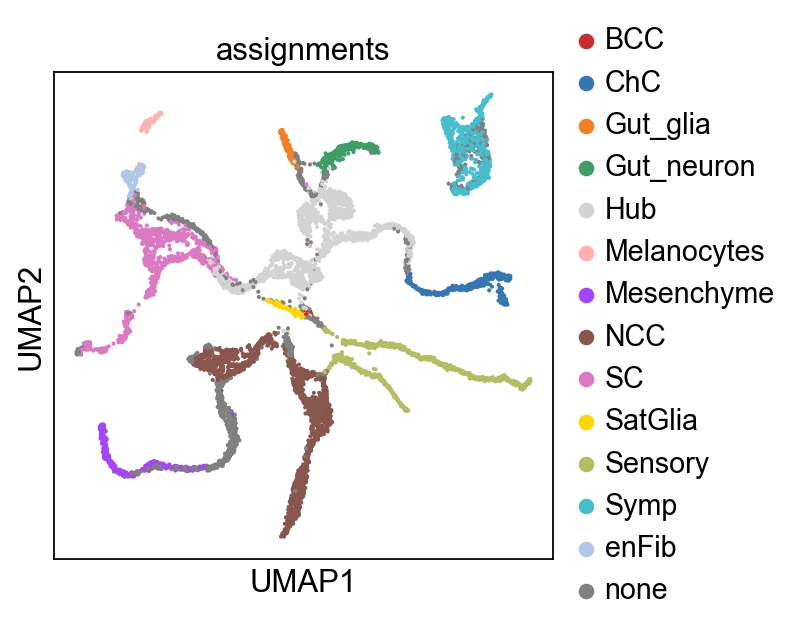

In [39]:
sc.pl.umap(adata_ss2,color="assignments",palette=[ass_cols[a] for a in adata_ss2.obs.assignments.cat.categories])

In [41]:
adata_ss2.uns["assignments_colors"]

['#cc2c30',
 '#3577b3',
 '#f58023',
 '#3f9d68',
 '#d3d3d3',
 '#ffb0af',
 '#a644fb',
 '#88564c',
 '#dc79c2',
 '#ffd700',
 '#b5bd63',
 '#47bece',
 '#b1c7e7',
 '#808080']

In [43]:
import numpy as np
adata.uns["assign_proj_colors"]=[np.array(adata_ss2.uns["assignments_colors"])[adata_ss2.obs.assignments.cat.categories==m] for m in adata.obs.assign_proj.cat.categories]


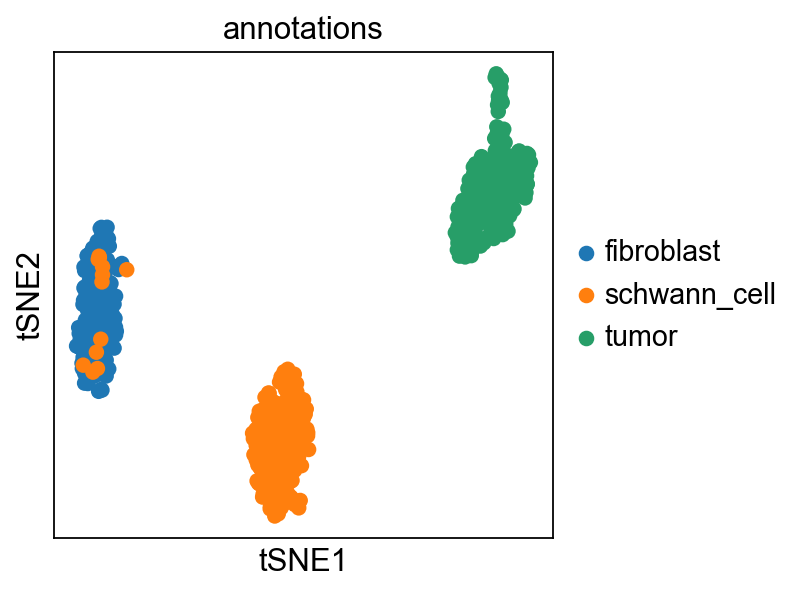

In [52]:
sc.pl.tsne(adata_velo,color="annotations")

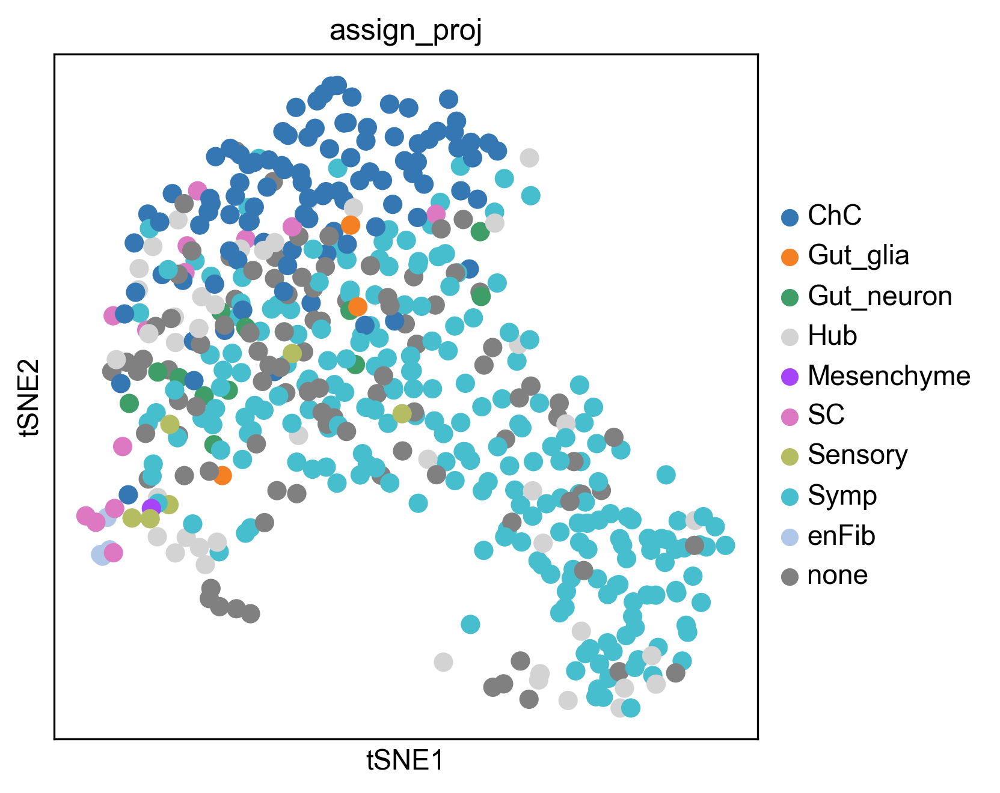

In [60]:
sc.pl.tsne(adata_velo,color="assign_proj",palette=[ass_cols[a] for a in adata_velo.obs.assign_proj.cat.categories])

In [66]:
import numpy as np
adata_velo.uns["assign_proj_colors"]

[array(['#3577b3'], dtype='<U7'),
 array(['#f58023'], dtype='<U7'),
 array(['#3f9d68'], dtype='<U7'),
 array(['#d3d3d3'], dtype='<U7'),
 array(['#a644fb'], dtype='<U7'),
 array(['#dc79c2'], dtype='<U7'),
 array(['#b5bd63'], dtype='<U7'),
 array(['#47bece'], dtype='<U7'),
 array(['#b1c7e7'], dtype='<U7'),
 array(['#808080'], dtype='<U7')]

In [72]:
dct_pal=dict(zip(["tumor","schwann_cell","fibroblast"],["tab:blue","#dc79c2","#b1c7e7"]))

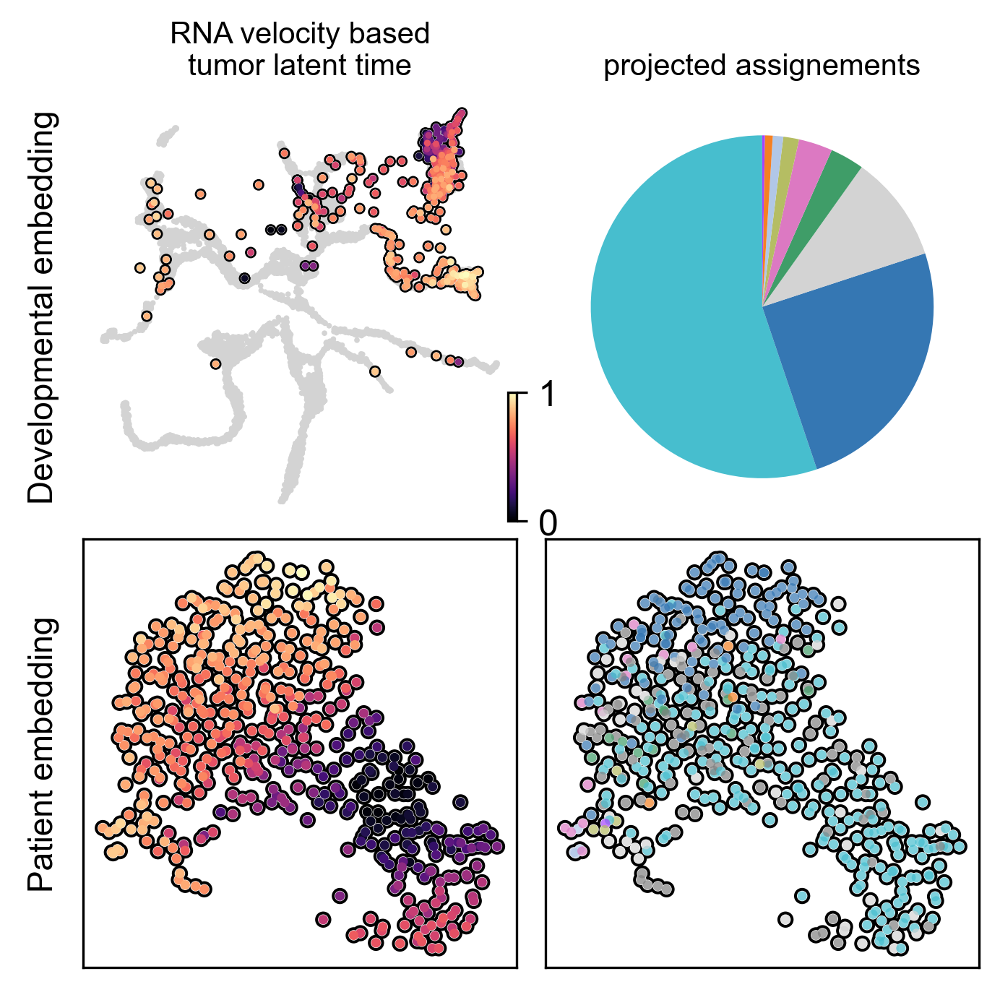

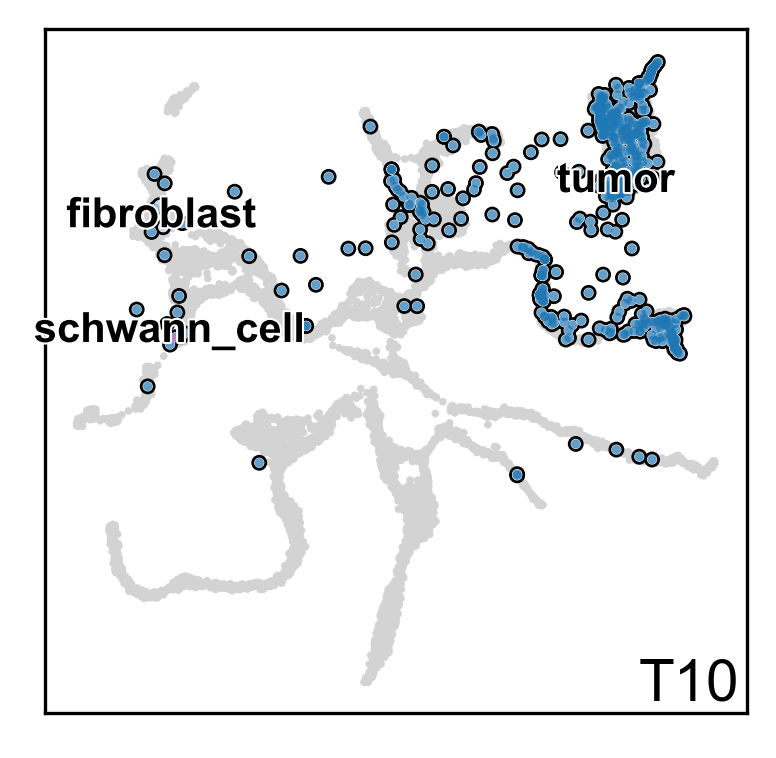

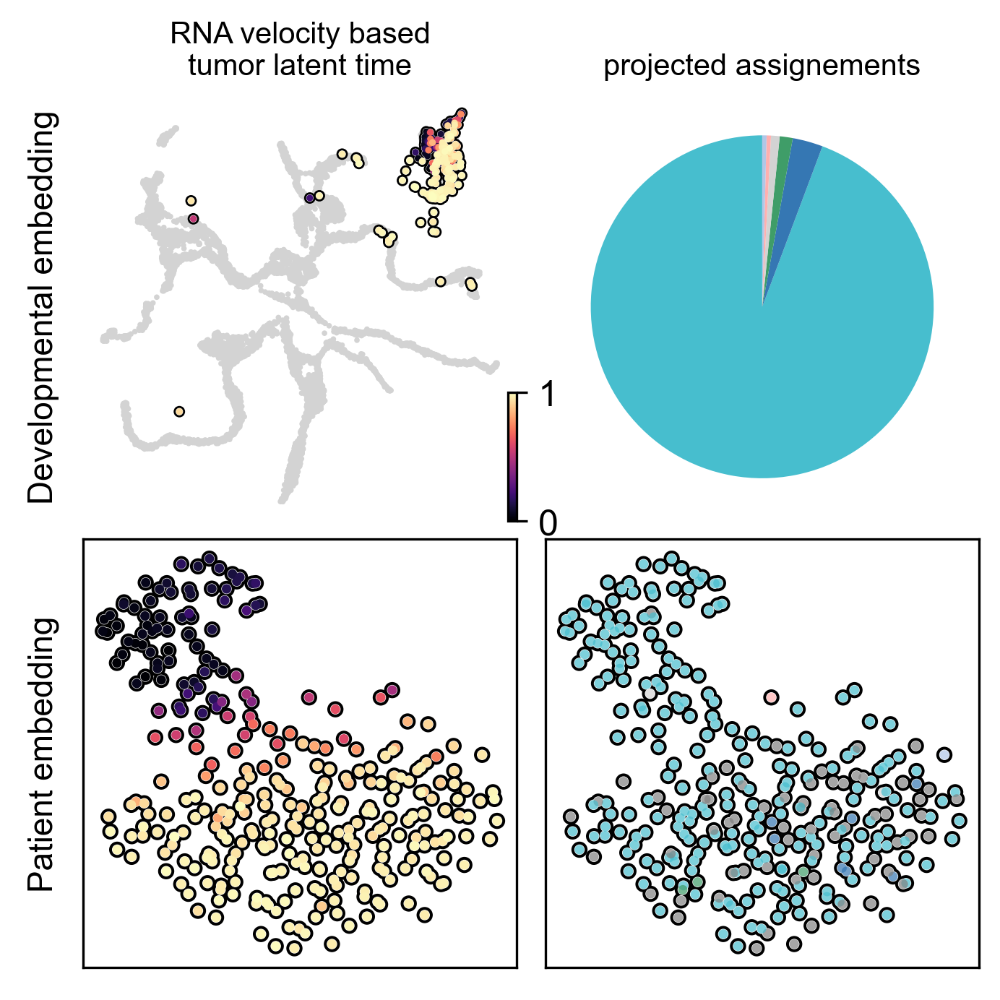

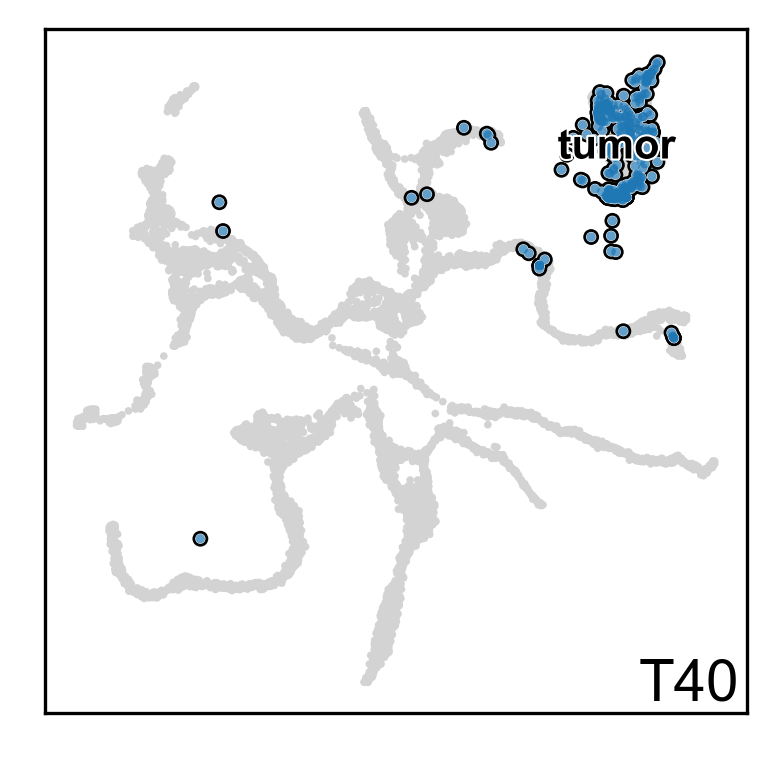

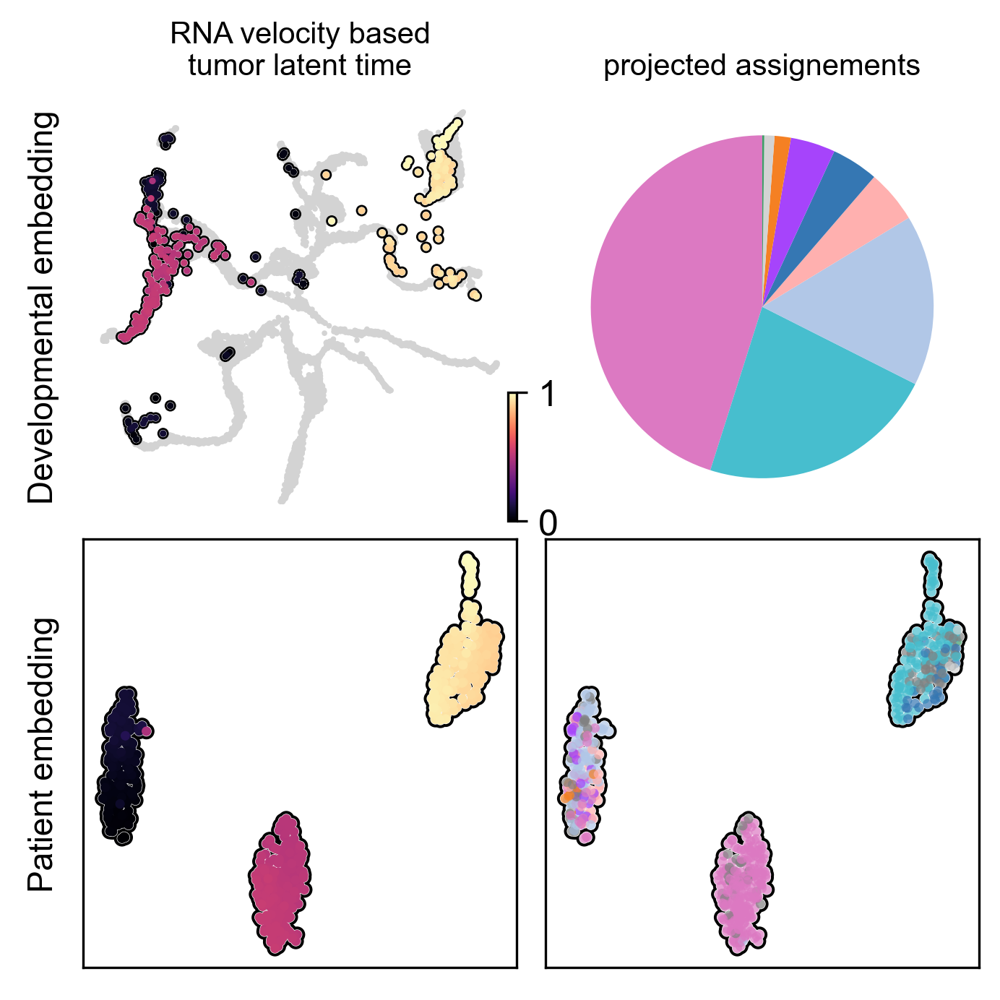

...

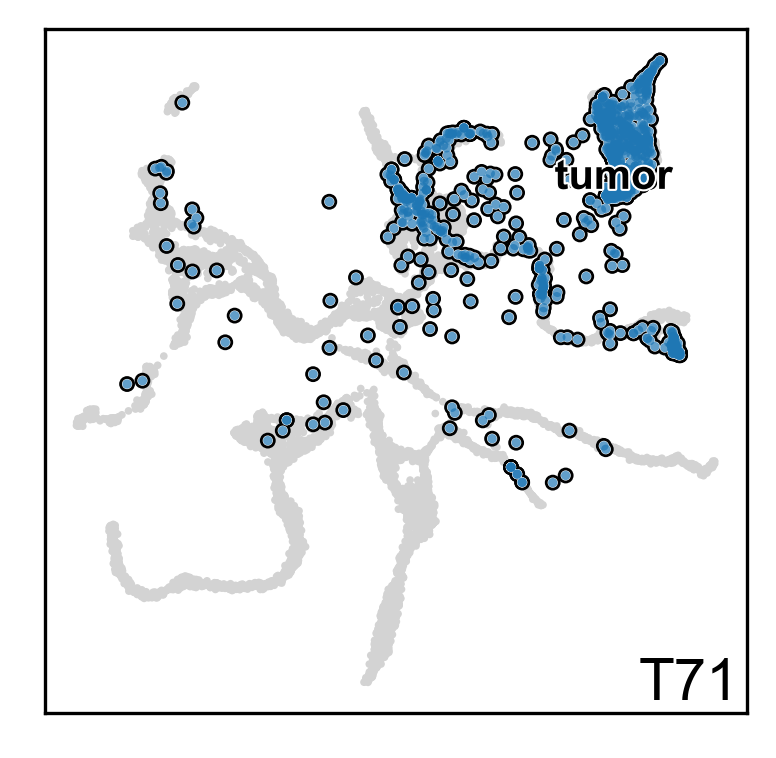

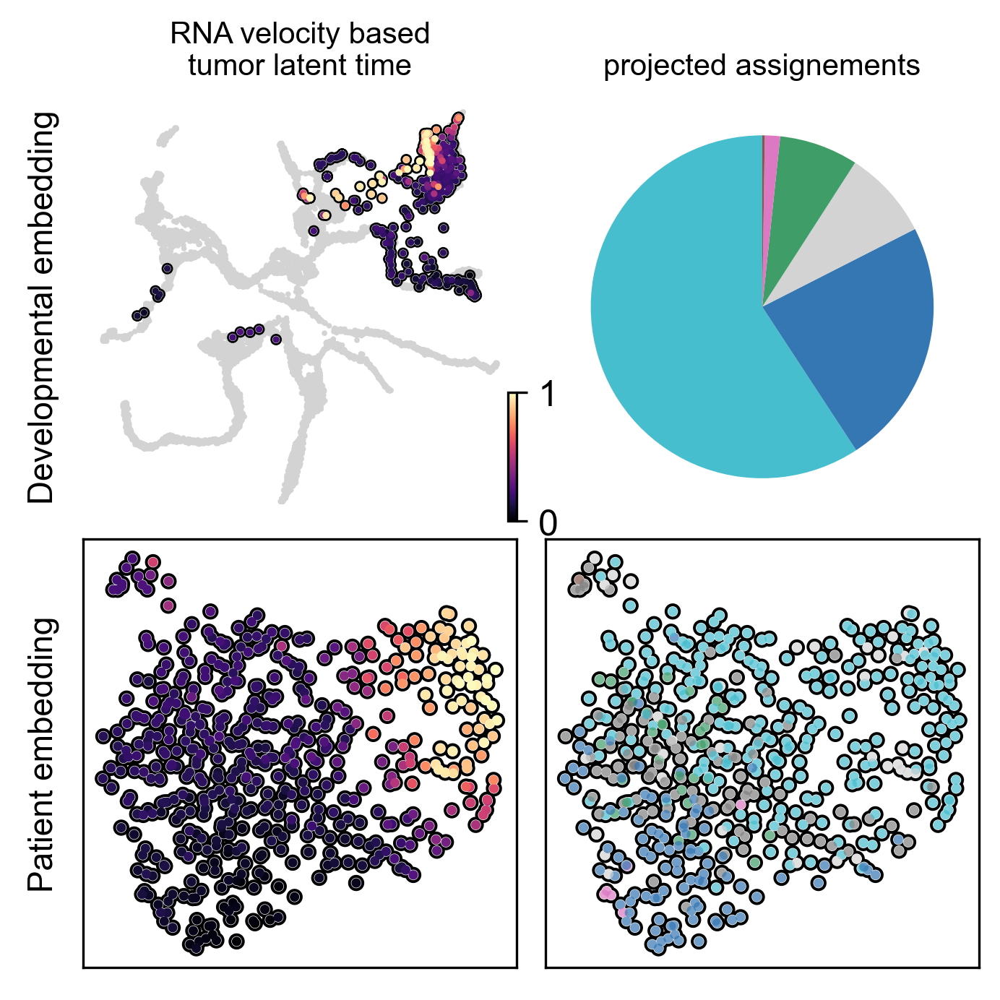

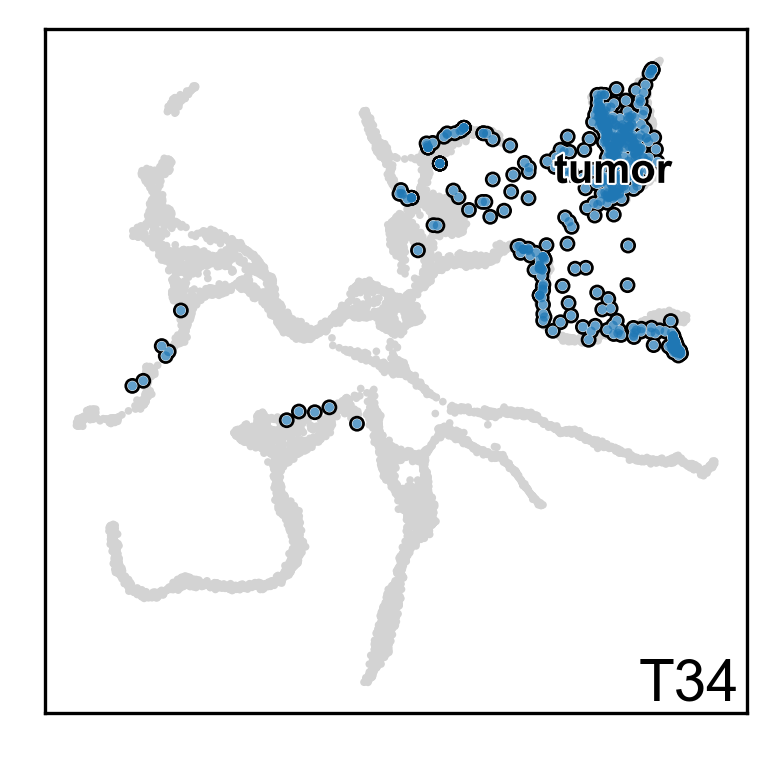

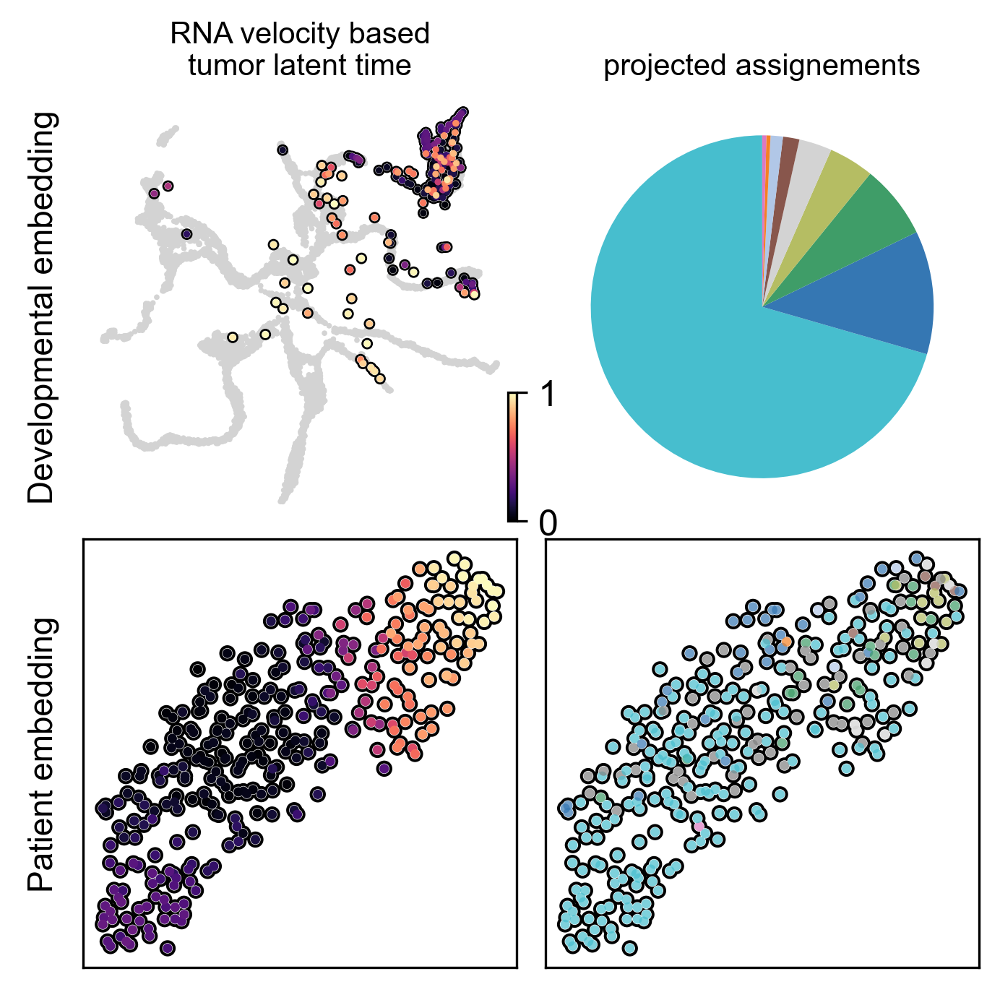

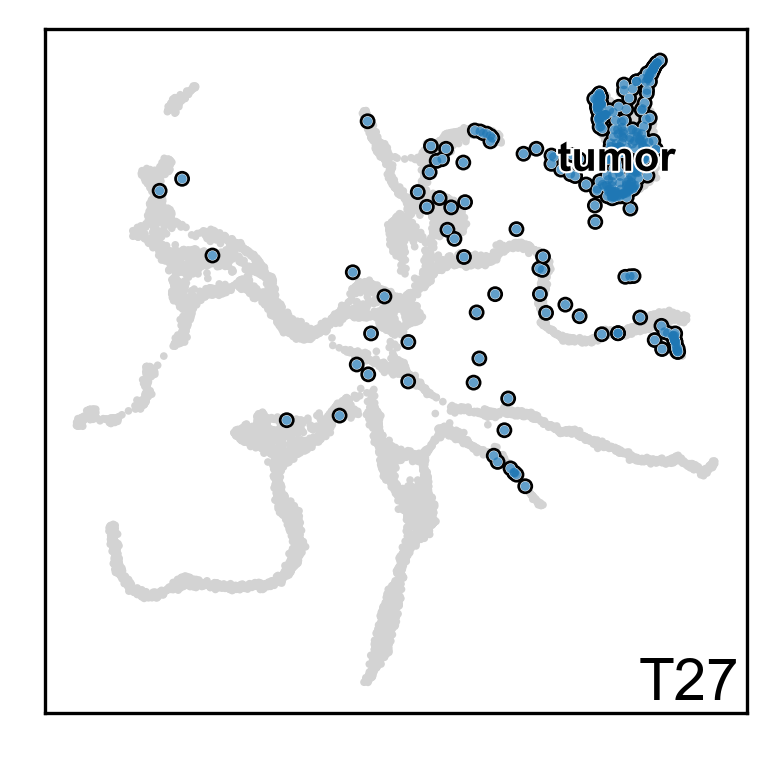

In [79]:
import matplotlib.pyplot as plt
for p in patients:
    fig = plt.figure(constrained_layout=True,figsize=(4.5,4.5))
    widths = [2, 3, 1.5]
    heights = [1, 3, 2]
    spec = fig.add_gridspec(ncols=3, nrows=2, width_ratios=[1,10,10])



    adata=sc.read("adatas/"+p+"_adata.h5ad")
    adata_velo=sc.read("adatas/"+p+"_adata_velo.h5ad")
    adata.uns["assign_proj_colors"]=[np.array(adata_ss2.uns["assignments_colors"])[adata_ss2.obs.assignments.cat.categories==m][0] for m in adata.obs.assign_proj.cat.categories]
    adata_velo.uns["assign_proj_colors"]=adata.uns["assign_proj_colors"]
    scv.set_figure_params(figsize=(5,5),dpi=150,frameon=False,fontsize=12,dpi_save=600)



    ax = fig.add_subplot(spec[0, 1])

    sc.pl.umap(adata_ss2,ax=ax,show=False,legend_loc=False)
    scv.pl.scatter(adata_velo, c="latent_time",ax=ax, cmap='magma',title="",
                   show=False,zorder=99,size=20,add_outline=True)

    ax.set_title("RNA velocity based\ntumor latent time",loc='center',fontdict={'fontsize':10})



    ax = fig.add_subplot(spec[1, 1])

    scv.pl.scatter(adata_velo,basis="tsne", c="latent_time",ax=ax, cmap='magma',title="",
                   show=False,zorder=99,size=40,colorbar=False,add_outline=True,frameon=True)


    ax.set_xlabel("")
    ax.set_ylabel("")
    
    props=adata.obs.assign_proj[adata.obs.assign_proj!="none"].value_counts()
    props=props[props!=0]
    labels = props.index.to_list()
    cols=ass_cols[labels]
    sizes = props.to_list()

    ax = fig.add_subplot(spec[0, 2])

    ax.pie(sizes,colors=cols,
            shadow=False, startangle=90,radius=1)
    ax.axis()
    ax.set_title("projected assignements",loc='center',fontdict={'fontsize':10})


    ax = fig.add_subplot(spec[1, 2])

    sc.pl.tsne(adata_velo,color="assign_proj",ax=ax,add_outline=True,frameon=True,show=False,legend_loc="None",size=40,title="")
    ax.set_xlabel("")
    ax.set_ylabel("")
    #plt.savefig("figures/"+p+".pdf",bbox_inches='tight')


    ax = fig.add_subplot(spec[0, 0])

    ax.text(0.5, 0.5, 'Developmental embedding',fontsize=11,
            horizontalalignment='center',
            verticalalignment='center',
            rotation='vertical',
            transform=ax.transAxes)
    ax.axis('off')

    ax = fig.add_subplot(spec[1, 0])

    ax.text(0.5, 0.5, 'Patient embedding',fontsize=11,
            horizontalalignment='center',
            verticalalignment='center',
            rotation='vertical',
            transform=ax.transAxes)
    ax.axis('off')
    plt.savefig("figures/"+p+".pdf",bbox_inches='tight')
    

    sc.set_figure_params(figsize=(3,3),dpi=150)
    fig, (ax1) = plt.subplots(nrows=1,ncols=1,figsize=(3,3))
    sc.pl.umap(adata_ss2,ax=ax1,show=False,legend_loc=False)
    sc.pl.umap(adata,color="annotations",ax=ax1,add_outline=True,size=20,
               show=False,legend_fontsize=10,palette=[dct_pal[a] for a in adata.obs.annotations.cat.categories],
              legend_loc="on data",legend_fontoutline=True,title="")
    ax1.set_ylabel("")
    ax1.set_xlabel("")
    ax1.annotate(p,(.99,0.02),ha="right",xycoords="axes fraction")
    #plt.savefig("figures/"+s+"_NB_mapping_annot.png",dpi=300)

    plt.savefig("figures/"+p+"-2.pdf",bbox_inches='tight')

In [54]:
%%bash
bash generate_report.sh

This is pdfTeX, Version 3.14159265-2.6-1.40.20 (TeX Live 2019/Debian) (preloaded format=pdflatex)
 \write18 enabled.
entering extended mode
(./report.tex
LaTeX2e <2020-02-02> patch level 2
L3 programming layer <2020-02-14>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2019/12/20 v1.4l Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/iftex.sty)))

Package geometry Warning: Over-specification in `h'-direction.
    `width' (597.50787pt) is ignored.


Package geometry Warning: Over-specification in `v'-direction.
    `height' (845.04684pt) is ignored.

(/usr/share/texlive/texmf-dist/tex/latex/base/inputenc.sty)
(/usr/share/texlive/texmf-dist/tex/latex/base/fontenc.sty)
(/usr/share/texl

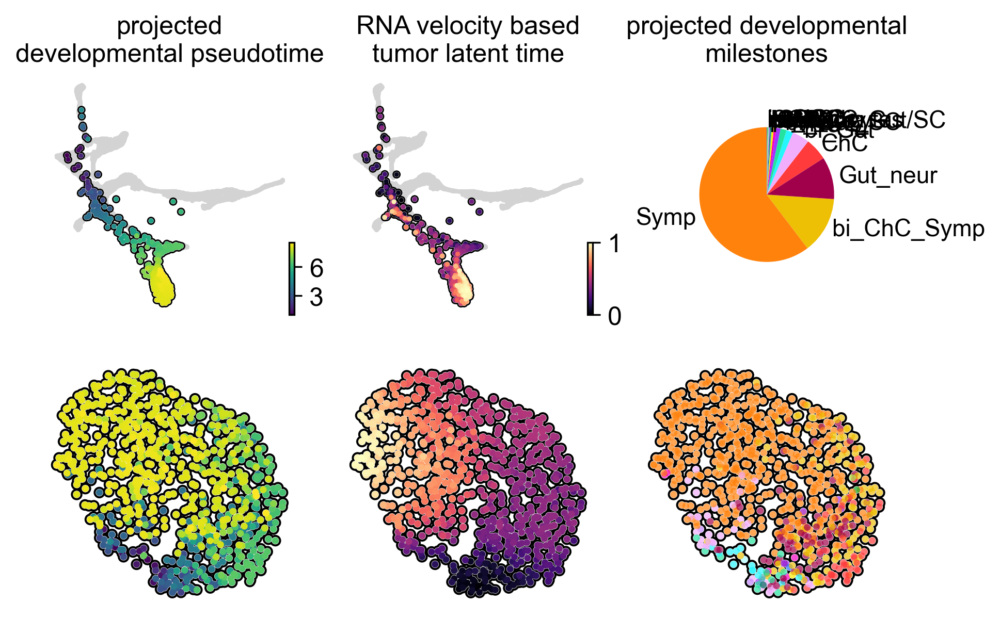

In [208]:
adata=sc.read("adatas/T92_adata.h5ad")
adata_velo=sc.read("adatas/T92_adata_velo.h5ad")
adata.uns["milestones_proj_colors"]=[adata_ss2.uns["milestones_colors"][adata_ss2.obs.milestones.cat.categories==m][0] for m in adata.obs.milestones_proj.cat.categories]

scv.set_figure_params(figsize=(5,5),dpi=150,frameon=False,fontsize=12,dpi_save=600)
fig, axs = plt.subplots(nrows=2,ncols=3,figsize=(7,4.5))
sc.pl.umap(adata_ss2,ax=axs[0,0],show=False,legend_loc=False)
scv.pl.scatter(adata_velo, c="pseudotime_proj",ax=axs[0,0], cmap='viridis',title="projected\ndevelopmental pseudotime",
               show=False,zorder=99,size=20,add_outline=True)

sc.pl.umap(adata_ss2,ax=axs[0,1],show=False,legend_loc=False)
scv.pl.scatter(adata_velo, c="latent_time",ax=axs[0,1], cmap='magma',title="RNA velocity based\ntumor latent time",
               show=False,zorder=99,size=20,add_outline=True)



scv.pl.scatter(adata_velo,basis="tsne", c="pseudotime_proj",ax=axs[1,0], cmap='viridis',title="",
               show=False,zorder=99,size=40,colorbar=False,add_outline=True)


scv.pl.scatter(adata_velo,basis="tsne", c="latent_time",ax=axs[1,1], cmap='magma',title="",
               show=False,zorder=99,size=40,colorbar=False,add_outline=True)


props=adata.obs.milestones_proj.value_counts()
props=props[props!=0]
devtimecol=dict(zip(adata.obs.milestones_proj.cat.categories,adata.uns["milestones_proj_colors"]))
labels = props.index.to_list()
sizes = props.to_list()
cols= [devtimecol[l] for l in labels]
axs[0,2].pie(sizes,colors=cols,labels=labels,
        shadow=False, startangle=90,radius=0.7)
axs[0,2].axis()
axs[0,2].set_title("projected developmental\nmilestones")

sc.pl.tsne(adata,color="milestones_proj",ax=axs[1,2],add_outline=True,show=False,legend_loc="None",size=40,title="")
plt.savefig("figures/T92.svg",bbox_inches='tight')

In [191]:
adata.layers["scaled"]=sc.pp.scale(adata.X,copy=True)
adata=adata[:,~adata.var_names.str.contains("^RPL*")]

Trying to set attribute `.uns` of view, copying.


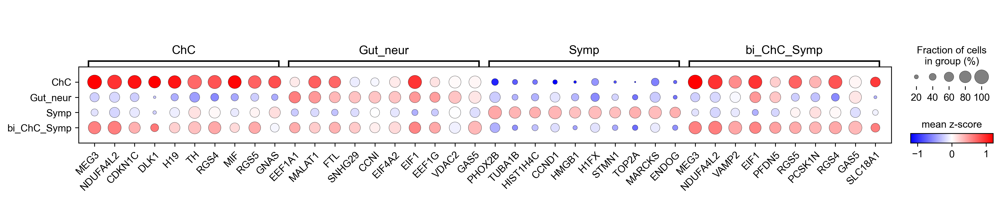

In [192]:
sc.tl.rank_genes_groups(adata,"milestones_proj",method="wilcoxon",groups=["ChC","Gut_neur","Symp","bi_ChC_Symp"])
ax=sc.pl.rank_genes_groups_dotplot(adata[adata.obs.milestones_proj.isin(["Symp","bi_ChC_Symp","Gut_neur","ChC"])],
                                dendrogram=False,layer="scaled",cmap="bwr",vmin=-1.2,vmax=1.2,show=False,var_group_rotation=0,
                                  colorbar_title='mean z-score')


plt.setp(ax['mainplot_ax'].get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
plt.savefig("figures/T92_dotplot.svg",bbox_inches='tight')

In [ ]:
adata.obs["undiff"]=~adata.obs.milestones_proj.isin(["ChC","Symp"])
adata.obs["undiff"]=adata.obs["undiff"].astype("category")
sc.tl.rank_genes_groups(adata,"undiff",method="wilcoxon")
df=sc.get.rank_genes_groups_df(adata,"True")
print("\n".join(df[~df.names.str.contains("RP")].names[:50].values))

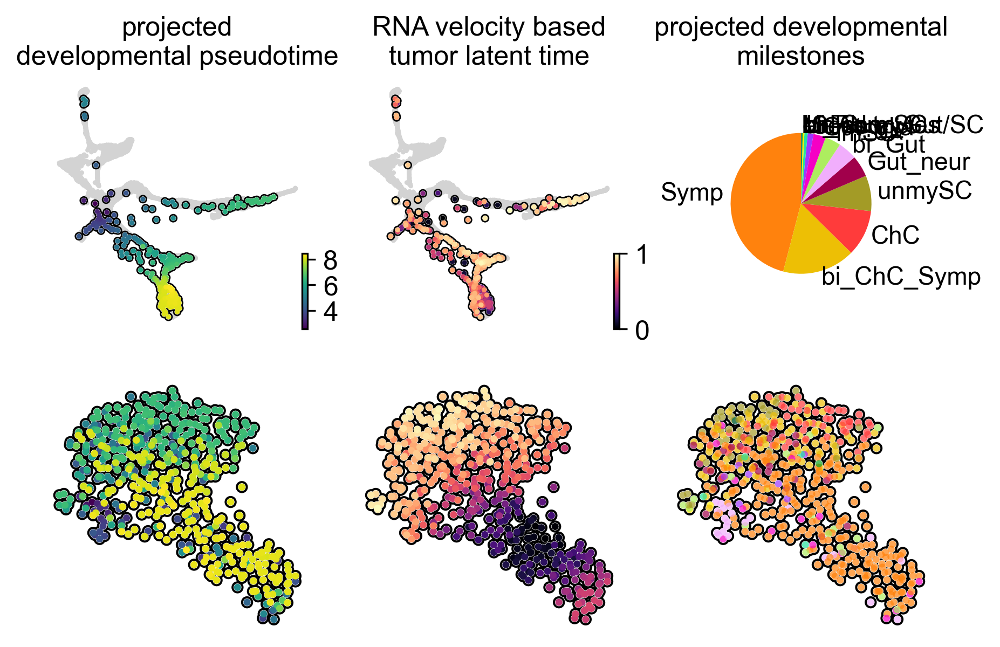

In [209]:
adata=sc.read("adatas/T10_adata.h5ad")
adata_velo=sc.read("adatas/T10_adata_velo.h5ad")
adata.uns["milestones_proj_colors"]=[adata_ss2.uns["milestones_colors"][adata_ss2.obs.milestones.cat.categories==m][0] for m in adata.obs.milestones_proj.cat.categories]

scv.set_figure_params(figsize=(5,5),dpi=150,frameon=False,fontsize=12,dpi_save=600)
fig, axs = plt.subplots(nrows=2,ncols=3,figsize=(7,4.5))
sc.pl.umap(adata_ss2,ax=axs[0,0],show=False,legend_loc=False)
scv.pl.scatter(adata_velo, c="pseudotime_proj",ax=axs[0,0], cmap='viridis',title="projected\ndevelopmental pseudotime",
               show=False,zorder=99,size=20,add_outline=True)

sc.pl.umap(adata_ss2,ax=axs[0,1],show=False,legend_loc=False)
scv.pl.scatter(adata_velo, c="latent_time",ax=axs[0,1], cmap='magma',title="RNA velocity based\ntumor latent time",
               show=False,zorder=99,size=20,add_outline=True)



scv.pl.scatter(adata_velo,basis="tsne", c="pseudotime_proj",ax=axs[1,0], cmap='viridis',title="",
               show=False,zorder=99,size=40,colorbar=False,add_outline=True)


scv.pl.scatter(adata_velo,basis="tsne", c="latent_time",ax=axs[1,1], cmap='magma',title="",
               show=False,zorder=99,size=40,colorbar=False,add_outline=True)


props=adata.obs.milestones_proj.value_counts()
props=props[props!=0]
devtimecol=dict(zip(adata.obs.milestones_proj.cat.categories,adata.uns["milestones_proj_colors"]))
labels = props.index.to_list()
sizes = props.to_list()
cols= [devtimecol[l] for l in labels]
axs[0,2].pie(sizes,colors=cols,labels=labels,
        shadow=False, startangle=90,radius=0.7)
axs[0,2].axis()
axs[0,2].set_title("projected developmental\nmilestones")

sc.pl.tsne(adata,color="milestones_proj",ax=axs[1,2],add_outline=True,show=False,legend_loc="None",size=40,title="")
plt.savefig("figures/T10.svg",bbox_inches='tight')

In [182]:
adata.layers["scaled"]=sc.pp.scale(adata.X,copy=True)
adata=adata[:,~adata.var_names.str.contains("^RPL*")]

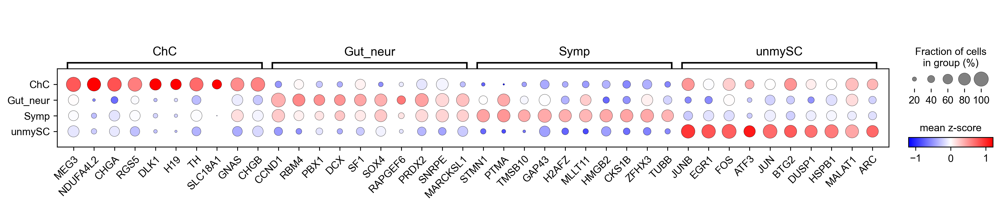

In [189]:
sc.tl.rank_genes_groups(adata,"milestones_proj",method="wilcoxon",groups=["ChC","Gut_neur","Symp","unmySC"])
ax=sc.pl.rank_genes_groups_dotplot(adata[adata.obs.milestones_proj.isin(["ChC","Gut_neur","Symp","unmySC"])],
                                dendrogram=False,layer="scaled",cmap="bwr",vmin=-1.2,vmax=1.2,show=False,var_group_rotation=0,
                                  colorbar_title='mean z-score')


plt.setp(ax['mainplot_ax'].get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
plt.savefig("figures/T10_dotplot.svg",bbox_inches='tight')

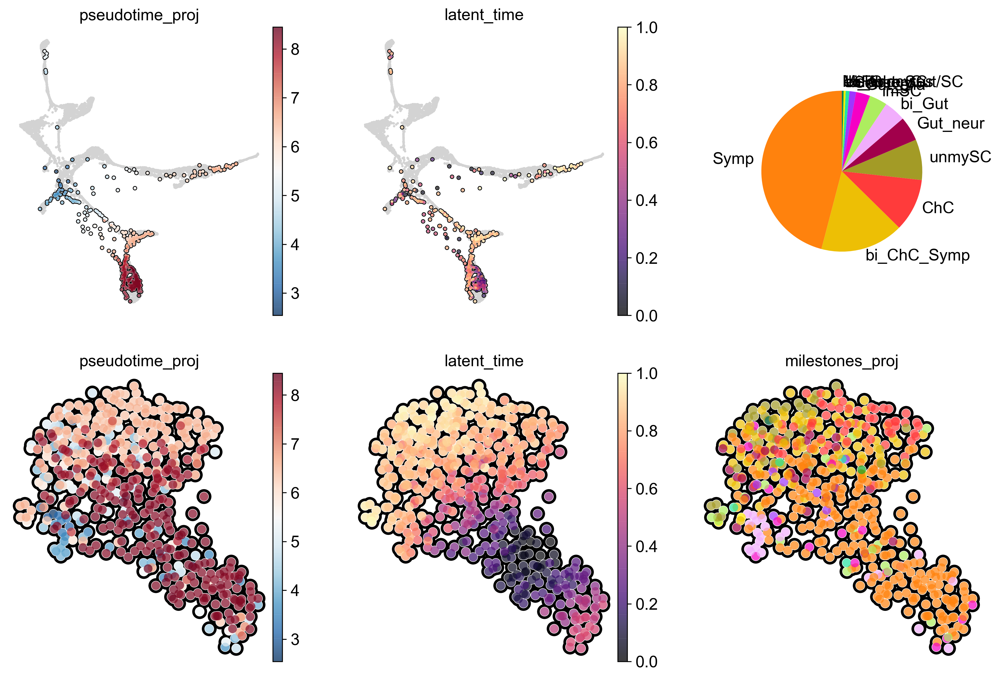

In [16]:
adata=sc.read("adatas/T10_adata.h5ad")
adata_velo=sc.read("adatas/T10_adata_velo.h5ad")
adata.uns["milestones_proj_colors"]=[adata_ss2.uns["milestones_colors"][adata_ss2.obs.milestones.cat.categories==m][0] for m in adata.obs.milestones_proj.cat.categories]

sc.set_figure_params(figsize=(5,5),dpi=150,frameon=False)
fig, axs = plt.subplots(nrows=2,ncols=3,figsize=(15,10))
sc.pl.umap(adata_ss2,ax=axs[0,0],show=False,legend_loc=False)
sc.pl.umap(adata,color="pseudotime_proj",ax=axs[0,0],add_outline=True,size=20,show=False)

sc.pl.umap(adata_ss2,ax=axs[0,1],show=False,legend_loc=False)
sc.pl.umap(adata_velo,color="latent_time",ax=axs[0,1],cmap="magma",add_outline=True,size=20,show=False)
#plt.savefig("figures/"+s+"_NB_mapping_annot.png",dpi=300)

sc.pl.tsne(adata,color="pseudotime_proj",ax=axs[1,0],add_outline=True,show=False)

sc.pl.tsne(adata_velo,color="latent_time",ax=axs[1,1],cmap="magma",add_outline=True,show=False)

props=adata.obs.milestones_proj.value_counts()
props=props[props!=0]
devtimecol=dict(zip(adata.obs.milestones_proj.cat.categories,adata.uns["milestones_proj_colors"]))
labels = props.index.to_list()
sizes = props.to_list()
cols= [devtimecol[l] for l in labels]
axs[0,2].pie(sizes,colors=cols,labels=labels,
        shadow=False, startangle=90,radius=0.7)
axs[0,2].axis()

sc.pl.tsne(adata,color="milestones_proj",ax=axs[1,2],add_outline=True,show=False,legend_loc="None")
plt.savefig("test.svg",bbox_inches='tight')

AGAGCGAAGTTGAGTA-T10    False
CACCTTGAGTGTGGCA-T10    False
GAAATGAGTGGTACAG-T10    False
GCATGCGAGTGACTCT-T10    False
CAGATCAAGCCTTGAT-T10    False
                        ...  
TACTCATAGCAGCGTA-T10    False
GTCATTTGTTGGTAAA-T10    False
GTGAAGGAGAATTGTG-T10    False
AAAGCAACAATAGCAA-T10    False
TCTATTGCAGCCTGTG-T10    False
Name: pseudotime_proj, Length: 527, dtype: bool

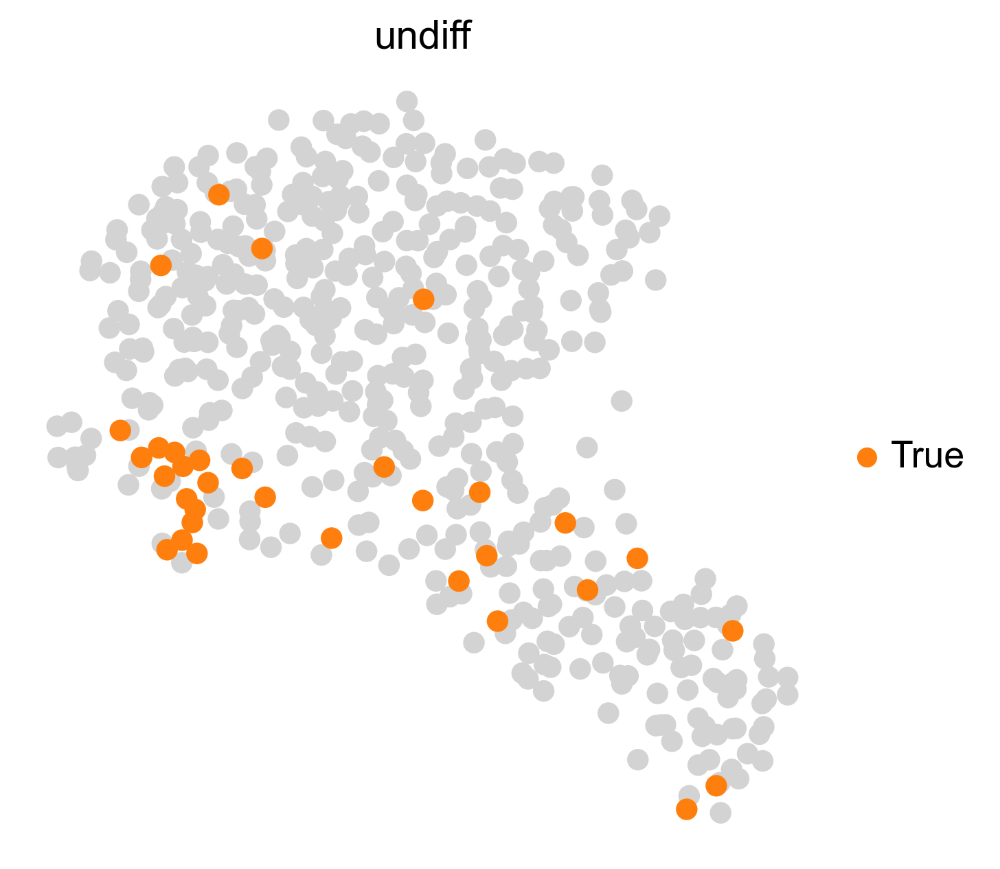

In [19]:
adata.obs["undiff"]=adata.obs.pseudotime_proj<4
adata.obs["undiff"]=adata.obs["undiff"].astype("category")

sc.pl.tsne(adata,color="undiff",groups=[True])

In [20]:
sc.tl.rank_genes_groups(adata,"undiff",method="wilcoxon")
df=sc.get.rank_genes_groups_df(adata,"True")
print("\n".join(df[~df.names.str.contains("RP")].names[:50].values))

TUBB
PTMA
STMN1
PCLAF
TUBA1B
HMGN2
CHCHD2
PPIA
HMGB2
HMGB1
TYMS
H2AFV
ATP5MF
CALM2
ATP5MPL
DEK
SKP1
NUCKS1
MTCH1
CBX3
TRMT112
YWHAE
DAD1
TMSB15A
ERH
PET100
UBB
SMS
LSM3
COX7A2
GAPDH
TK1
NUDT1
H2AFZ
LSM5
PSIP1
ST13
NHP2
GMNN
SUB1
LDHB
CYCS
CKS1B
DUT
TMA7
BIRC5
NENF
RANBP1
MAD2L1
GGCT
